<h1> Assignment 2 </h1>
<p> For assignment 2, an overview of the full learning pipeline is given. The first three sections show the preliminary work that was done before creating a predictive model. More specifically, in section 1 we discuss some trade-off we make in terms of the tag selection. In section 2, the method to upload and convert all the necessary images is explained. Finally, we split the data into 3 datasets: train, test and validation. </p> 
<p> Under section 4, we present the model architecture, and our chosen hyperparameters. This is followed by section 5 on the compilation of the model, and then section 6 on the implementation of data augmentation, and how we avoid overfitting. </p> 
<p> In section 7 and 8, we fit and evaluate the model with our chosen metric.</p>
<p> Finally, we wrap up in section 9 and 10 by making predictions on our test data and by visualizing the kernels of the layers of our model. </p>

In [1]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import numpy as np
import pandas as pd
import os
from sklearn.model_selection import train_test_split
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import Model
from keras.layers import Dense,Flatten
from keras.optimizers import Adam
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from numpy import expand_dims
from keras.applications.vgg16 import preprocess_input
import matplotlib.pyplot as pyplot

Using TensorFlow backend.


In [2]:
def plot_loss(loss,val_loss):
  plt.figure()
  plt.plot(loss)
  plt.plot(val_loss)
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper right')
  plt.show()
def plot_accuracy(acc,val_acc):
  # Plot training & validation accuracy values
  plt.figure()
  plt.plot(acc)
  plt.plot(val_acc)
  plt.title('Model accuracy')
  plt.ylabel('Accuracy')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

<h2> 1. Feature Engineering </h2>

In this section we will proceed with (pre)processing the datasets. It contains 11696 observations and 104 features, it is quite likely that there are many variables and observations that won't be used for the rest of this journey. So let's get started by looking for missing values.

<h3> 1.1 Missing Values </h3>

After noticing that some pictures from the dataset are empty or completely black we decide to 'manually' remove them from the meta-dataset.

In [3]:
# Import the labels
labels = pd.read_csv('C:/Users/david/Documents/0_kul/1_ma_stds_1/1_advanced_analytics/assignment_2/final/data/original/labels/recipes.csv',delimiter=';')
# Make a dataframe with unwanted images. We add those manually.
empty = ['CMbgB5tjSJa', 'CMbJFC-F3Tz',' CMmV2A2sBvY', 'CMMyIsZgX31', 'CMO5_RRDV5z',
'CMO98R3n1M3', 'CMO967MAl3V','CMOOv-qh1fN', 'CMP4fSDrLhn', 'CMT_uYYFJIp', 'CMTz1OZqDAG','CMmV2A2sBvY']
labels_undesired = labels[labels['photo_id'].isin(empty)]
labels = labels.drop(labels_undesired.index)

Next, we sum the tags that each picture has, and then visualize this result in a bar plot. It is found that more than 5000 images are tagless. Therefore, we remove these pictures from the dataset. Another insight from the plot below can be drawn: there is a large amount of images that have many tags. In conclusion, the quality of the dataset should be considered throughout the entire workflow. Therefore, the dataset requires a thorough selection and preprocess, which will happen in the next section.

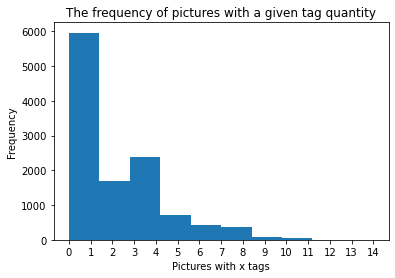

In [4]:
labels['count_all_tags'] = labels.iloc[:,7:].apply(sum,axis=1)
plt.hist(labels['count_all_tags'])
plt.xticks(range(0,15))
plt.title('The frequency of pictures with a given tag quantity')
plt.xlabel("Pictures with x tags")
plt.ylabel("Frequency")
plt.show()

<h3> 1.2 Tag selection </h3> 
<p> In this section we ask ourselves : "Which tags are we going to predict?". It becomes quickly clear that we need to be careful when taking tags into account. There is no clear rule in the hashtag-instragram picture world. Instagram users are free to use whatever hashtag they want. Some important reflection on this matter: </p>

<p>1) Some people may use tags reflecting actual food, but other might be using tags reflecting a concept. For example, a picture of a pasta is quite recognizable: you can expect some pomodore sauce, some cheese, some spaghetti etc. However, some people might just use the tag "italy" or "italianfood". This can be easily understood by someone who has knowledge of the italian culture, but that is not always the case. Concepts are difficult to translate into pixels, and therefore predicting a concept tag is quite different than predicting a food tag.
Perhaps a more clear example: tags such as breakfast, lunch, and dinner are even more subjective than the previous example. In essence, there are many fuzzy tags that seem inherently difficult to predict. 
Therefore, we decide to stick to tags that are universally understood, and are less subjective. It is much more feasible to predict the tag "lemon" than the tag "italianfood". </p>
<p>    
2) We also try to make a selection of more or less balanced tags, therefore we select tags that have a similar frequency. This is to avoid a tag that dominates the other. </p>

<p> 3) Some tags are very similar to each other and need to be grouped. Different tags can be grouped such as tag_chocolate and tag_chocolat. </p>
    
<p>To conclude, after a long process of experimenting with tags, we simply decide to make a binary model that can detect whether the image provided contains chocolate or cheese in it. We will merge related tags with each other. </p>

In [5]:
only_tags_2 = labels.iloc[:,7:]
frequency_tags = only_tags_2.apply(sum,axis=0)
frequency_tags.sort_values(ascending=False).head(60)

count_all_tags           23942
tag_healthy               1422
tag_dinner                1285
tag_tasty                 1261
tag_breakfast              909
tag_vegan                  872
tag_lunch                  820
tag_dessert                777
tag_baking                 744
tag_cake                   599
tag_vegetarian             564
tag_chocolate              562
tag_easyrecipes            560
tag_sweet                  465
tag_pasta                  448
tag_glutenfree             374
tag_fitness                357
tag_diet                   346
tag_plantbased             340
tag_chicken                327
tag_veganfood              322
tag_weightloss             283
tag_italianfood            281
tag_cheese                 280
tag_pastry                 251
tag_salad                  251
tag_comfortfood            246
tag_fresh                  236
tag_keto                   235
tag_cookies                230
tag_snack                  229
tag_bread                  203
tag_prot

In [6]:
labels['tag_chocolate_concept'] = labels['tag_chocolat'] + labels['tag_chocolate']
# Where True, yield x, otherwise yield y
labels['tag_chocolate_concept']= np.where(labels['tag_chocolate_concept']>=1, 1, 0)

In [7]:
keep = ['photo_id', 'url', 'may_be', 'likes', 'timestamp', 'scraped_at',
       'diff','tag_chocolate_concept','tag_cheese']
labels = labels[keep]
labels['count_tags'] = labels.iloc[:,7:].apply(sum,axis=1)
# Basically, keep only pictures that have 1 tag in either chocolate or cheese
labels = labels[labels['count_tags'] == 1]
labels.drop(["count_tags",'tag_cheese'],axis=1,inplace=True)

In [8]:
labels.shape

(845, 8)

In [9]:
only_tags = labels.iloc[:,7:]
# How many pictures do we have that contain the tag chocolate?
frequency_tags = only_tags.apply(sum,axis=0)
frequency_tags.sort_values()

tag_chocolate_concept    578
dtype: int64

<h3> 1.3 Create a y variable </h3>
<p> Here, we simply create a y variable that contains only the predictor variable. </p>

In [10]:
necessary_columns = labels.columns[7:]
# prepping y variable. necessary columns should be all the tags we want
y = labels[necessary_columns]
print(y.shape)

(845, 1)


<h2> 2. Loading the pictures and converting to array </h2>
<p> The dataset has been reduced to only the necessary images and tags we desire. Now, it is time to convert the images into an array. One of the requirements of the convolutional neural network is the consistency of shape across images. Therefore, we convert all the images into an equal shape of (224,224,3). In other words, each image has a width of 224 and length of 224, with 3 color layers: red, green and blue. After extracting, we end up with 845 images to train our model.  </p>

In [11]:
os.chdir('C:/Users/david/Documents/0_kul/1_ma_stds_1/1_advanced_analytics/assignment_2/final/data/original/pictures')
# creating function to extract pixel from png
def get_images(path):
    X = []
    for img_path in path:
        img = image.load_img(img_path,target_size=(224,224)) # we choose a size of 224 x 224
        x = image.img_to_array(img)
        X.append(x)
    return np.array(X)

In [12]:
# create the id of each image
id = labels.photo_id.values
print(id.shape)
# creating the path
my_path = id +'.png'

(845,)


In [13]:
# Extracting the pixels from the images
x = get_images(my_path)
print(type(x))
print(x.shape)

<class 'numpy.ndarray'>
(845, 224, 224, 3)


<h2> 3. Train test split </h2>
<p> If we want to evaluate the prediction power of our model, it is necessary to have a test set. Additionally, we want to have a validation set in order to allow for improvement of our model while training. Therefore, we split the data into 3 datasets: a train, test and validation dataset. </p>

In [14]:
x_tra,x_val,y_tra,y_val = train_test_split(x,y,test_size=0.1,random_state=42)
x_train,x_test,y_train,y_test = train_test_split(x_tra,y_tra,test_size=0.2,random_state=42)
# examine number of samples in train, test, and validation sets
print(y.shape)
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')
print(x_val.shape[0], 'validation samples')

(845, 1)
x_train shape: (608, 224, 224, 3)
608 train samples
152 test samples
85 validation samples


<h2> 4. Model Architecture </h2>
<p> We haven chosen to create a convolutional neural network by using the Keras package. After experimenting with our own cnn architecture, we decide to use the VGG16 architecture for our final model. In this section, we present the architecture of the model. </p>

<h3> 4.1 VGG16 Architecture </h3>
<p> There are many pre-trained models to choose from and this could take a long time to investigate which one of them would yield the best result. However, for this assignment we opt for the trustworthy VGG16 which was trained to identify 1000 objects. The VGG16 architecture is visualized below.
Essentially the VGG16 starts with the input layer: 'input_1'. It requires a shape of (224,224,3), but the shape of the image can be changed easily.
    
After, there are two hidden convolutional layers that have both 64 nodes. The kernels of each layers have a size of 3 x 3. Another important detail, the stride is equal to 1, that means that the kernel moves 1 place. The activation function of the hidden layers is 'ReLu'.
    
Finally, there is a pooling layer that helps us reduce the size of the image. Reducing the pixel size will reduce the amount of parameters. In this case the pooling layer reduces it to a 112 x 112 dimension with 128 nodes. As can be seen from the summary, our model has more than 14 million parameters.
        
This process repeats a few times: convolutional layers and a pooling layer.</p>

In [15]:
vggmodel = VGG16(weights='imagenet', include_top=False, input_shape= (224,224,3))

In [16]:
vggmodel.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

<h3> 4.2 Transfer Learning </h3>
<p> We are not only using the VGG16 architecture, but also the trained weights. In other words, we apply transfer learning. We essentially copy the weights and architecture, and make adjustments according to our needs.</p>

<p> How do we do this? By freezing the weights up until a certain layer. Additionally, we add some of our own layers, and obviously change the output layer according to tags we want to predict. Since we have a binary problem, the activation function of the output layer is a sigmoid function. </p>

In [17]:
base_model = Model(vggmodel.input,vggmodel.get_layer("block5_pool").output) # Gets all layers until block5_pool

In [18]:
for layers in (vggmodel.layers)[:19]:
    print(layers)
    layers.trainable = False

In [19]:
base_out = base_model.output
top_fc0 = Flatten()(base_out)
top_fc1 = Dense(64,activation='relu',kernel_initializer='he_uniform')(top_fc0)
top_fc2 = Dense(32,activation='relu')(top_fc1)
top_preds = Dense(1,activation = 'sigmoid')(top_fc2)

In [20]:
model = Model(base_model.input,top_preds)

In [21]:
model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [22]:
# Make sure you have frozen the correct layers
for i, layer in enumerate(model.layers):
    print(i, layer.name, layer.trainable)

0 input_1 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 False
12 block4_conv2 False
13 block4_conv3 False
14 block4_pool False
15 block5_conv1 False
16 block5_conv2 False
17 block5_conv3 False
18 block5_pool False
19 flatten_1 True
20 dense_1 True
21 dense_2 True
22 dense_3 True


<h2> 5. Model Compile </h2>
<p> Here, we have a crucial step where we determine the loss function, optimizer and metrics. There is a wide variety of choices. Since we have a binary problem, it is normal to use the binary crossentropy. Regarding the optimizer, we will use Adam with a learning rate of 0.0001. Finally, the metric for this problem is accuracy.  </p>

In [23]:
model.compile(loss = "binary_crossentropy", optimizer = Adam(lr=0.0001), metrics=['accuracy'])

<h2> 6. Data Augmentation and Avoid overfitting </h2>
<p> A way to artificially increase our dataset is by doing data augmentation. Keras has an easy way to do that through the ImageDataGenerator. The rotation_change argument will randomly rotate the image clockwise by a degree of 20. The width_shift_range and height_shift_range arguments control the amount of horizontal and vertical shift. The horizontal_flip argument is set to 'True' which will reverse the columns of pixel. The zoom_range argument will zoom in and out of objects. Batch size controls the number of images returned from the generator each call.  </p>
</p> To avoid overfitting, we set up an EarlyStopping based on the validation loss. Once it does not change after 3 epochs, then it automatically stops the fit. </p>

In [24]:
from keras.preprocessing.image import ImageDataGenerator
gen = ImageDataGenerator(rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2, horizontal_flip = True, zoom_range=0.3)
train_it = gen.flow(x_train,y_train,batch_size=64)
val_it = gen.flow(x_val,y_val,batch_size = 64)

In [25]:
os.chdir('C:/Users/david/Documents/0_kul/1_ma_stds_1/1_advanced_analytics/assignment_2/final/notebooks/1_binary/model_choco')
early_stopping = EarlyStopping(monitor='val_loss',patience=3)
modelCheckpoint = ModelCheckpoint('best_model_upgrade.hdf5',save_best_only=True)

<h2> 7. Model Fit </h2>
<p> There are some final steps before fitting the model. We need to decide upon how many epochs we will execute. Because we have created a EarlyStopping object, that allows us to let it run until it stops according to the EarlyStopping. Therefore we set a large amount such as 50. Next, the steps_per_epoch is the total number of steps to yield from the generator before declaring one epoch finished and starting the next epoch. We set it equal to the length of our generator. Similarly, for the validation_steps.The callbacks takes the previously defined objects as arguments. The validation_data is the data we split and transformed with the ImageDataAugmentation. Verbose simply shows the process bar. </p>

In [26]:
h_callback = model.fit_generator(train_it,epochs = 50, steps_per_epoch = len(train_it), 
                                      validation_steps = len(val_it),callbacks = [early_stopping,modelCheckpoint],
                                      validation_data = val_it, verbose = 1)

Epoch 1/50
10/10 [==============================] - 117s 12s/step - loss: 2.6734 - accuracy: 0.5674 - val_loss: 1.3851 - val_accuracy: 0.5765
Epoch 2/50
10/10 [==============================] - 141s 14s/step - loss: 1.1071 - accuracy: 0.6349 - val_loss: 1.0287 - val_accuracy: 0.5765
Epoch 3/50
10/10 [==============================] - 164s 16s/step - loss: 0.9373 - accuracy: 0.6266 - val_loss: 0.7976 - val_accuracy: 0.6706
Epoch 4/50
10/10 [==============================] - 173s 17s/step - loss: 0.7178 - accuracy: 0.6760 - val_loss: 0.7451 - val_accuracy: 0.6235
Epoch 5/50
10/10 [==============================] - 185s 19s/step - loss: 0.6548 - accuracy: 0.6776 - val_loss: 1.0355 - val_accuracy: 0.6941
Epoch 6/50
10/10 [==============================] - 183s 18s/step - loss: 0.6269 - accuracy: 0.7204 - val_loss: 0.8253 - val_accuracy: 0.7059
Epoch 7/50
10/10 [==============================] - 168s 17s/step - loss: 0.5729 - accuracy: 0.7138 - val_loss: 0.8434 - val_accuracy: 0.6588


<h2> 8. Evaluate model </h2>
<p> We retrieve a model with an accuracy of 75%. </p>
<p> We see that our model does better than a random model, which is already a good sign. The model has not a high accuracy, however that might be due to the data quality. The poor data quality can be explained as following: the images are retrieved from instragram posts, and thus the rules on Instragram does not force you to correctly associate tags and images. On top of that, Instagram posts can express a story of several pictures. A person can share his/her entire food history of the day with all the associated tags with those pictures. It can go further than that, a person can associate food tags with concepts/travels, and therefore making it difficult to infer the meaning of the tags from one single picture while there might be many more.  </p>

In [27]:
model.evaluate(x_train,y_train)

608/608 [==============================] - 156s 257ms/step


[0.4880034382406034, 0.7944079041481018]

In [28]:
model.evaluate(x_test,y_test)

152/152 [==============================] - 37s 240ms/step


[0.6127030849456787, 0.75]

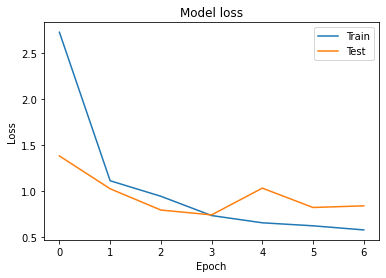

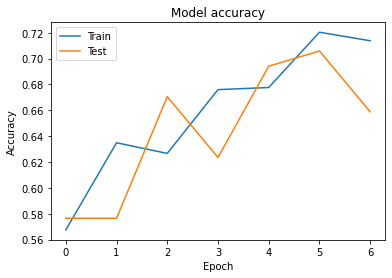

In [29]:
# Plot train vs test loss during training
plot_loss(h_callback.history['loss'], h_callback.history['val_loss'])
# Plot train vs test accuracy during training
plot_accuracy(h_callback.history['accuracy'], h_callback.history['val_accuracy'])

<h2> 9. Make Predictions </h2>
<p> In this section we predict the tags of some selected pictures, and then look at the real tags. </p>

In [30]:
columns = labels.columns[:7]
labels.drop(columns,inplace=True,axis=1)

In [31]:
result = model.predict(x_test)
list_prediction = []
for i in range(0,len(result)):
    prediction = result.round().tolist()[i][0]
    list_prediction.append(prediction)

In [32]:
mydict = {
    'real_tag' : y_test.tag_chocolate_concept,
    'predicted_tag' : list_prediction
}
df_prediction = pd.DataFrame(mydict)
print(df_prediction.tail(10))

       real_tag  predicted_tag
10194         1            1.0
2237          1            1.0
5983          1            1.0
571           1            1.0
5488          0            0.0
10462         1            1.0
7658          1            0.0
4656          0            1.0
9880          1            1.0
9529          1            1.0


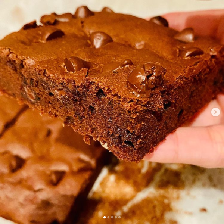

In [33]:
# Visually check the image you will predict
img_35 = image.array_to_img(x[0,:,:])
img_35

<h2> 10. Visualize filters and feature maps in cnn </h2>
<p> In this last section we visualize the kernels of the convolutional layers in order to see through the "eyes" of the layers, and by consequence, uncovering this black box model. We can see that the feature maps closer to the input of the model capture a lot of fine detail in the image and that as we progress deeper into the model, the feature maps show less and less detail. </p>

In [34]:
# summarize filter shapes
for layer in model.layers:
    # check for convolutional layer
    print(layer.name)
    if 'conv' not in layer.name:
        continue

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_pool
flatten_1
dense_1
dense_2
dense_3


In [35]:
# summarize filter shapes
for layer in model.layers:
	# check for convolutional layer
	if 'conv' not in layer.name:
		continue
	# get filter weights
	filters, biases = layer.get_weights()
	print(layer.name, filters.shape)

block1_conv1 (3, 3, 3, 64)
block1_conv2 (3, 3, 64, 64)
block2_conv1 (3, 3, 64, 128)
block2_conv2 (3, 3, 128, 128)
block3_conv1 (3, 3, 128, 256)
block3_conv2 (3, 3, 256, 256)
block3_conv3 (3, 3, 256, 256)
block4_conv1 (3, 3, 256, 512)
block4_conv2 (3, 3, 512, 512)
block4_conv3 (3, 3, 512, 512)
block5_conv1 (3, 3, 512, 512)
block5_conv2 (3, 3, 512, 512)
block5_conv3 (3, 3, 512, 512)


In [36]:
# normalize filter values to 0-1 so we can visualize them
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

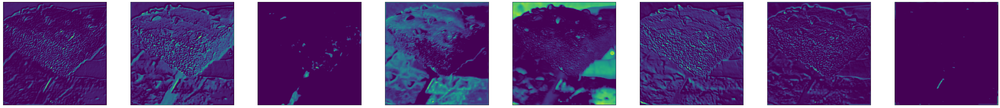

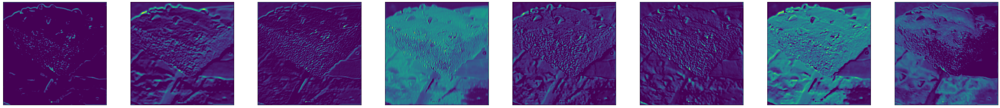

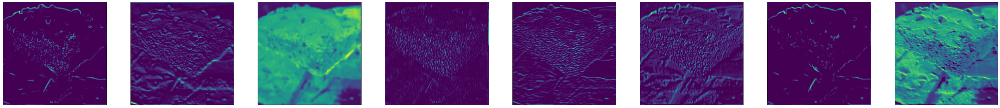

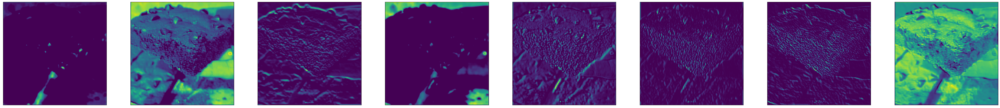

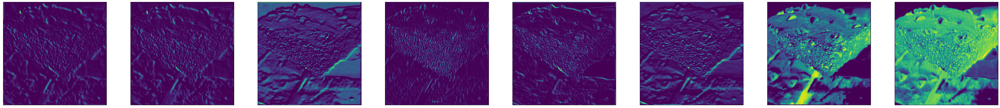

...

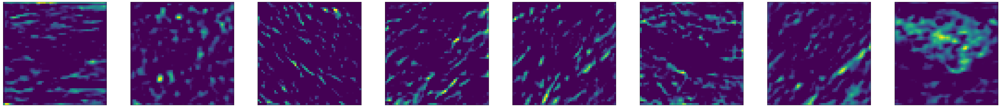

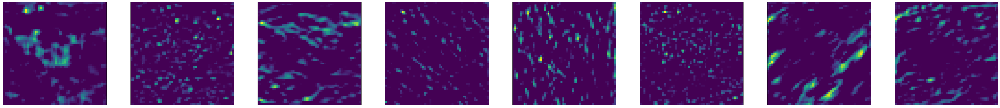

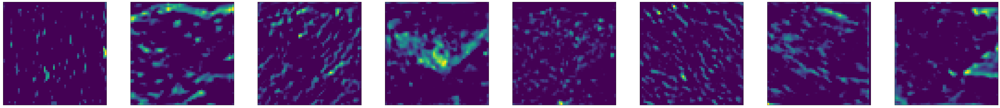

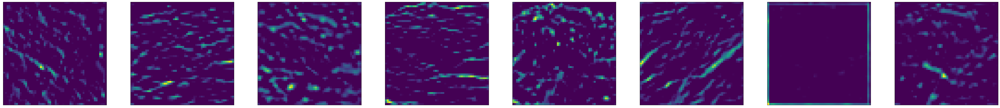

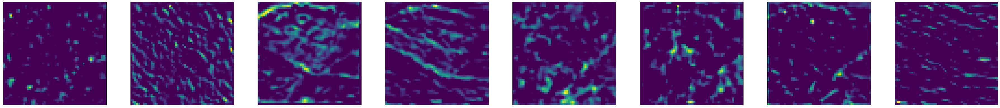

In [37]:
# redefine model to output right after the first hidden layer
ixs = [2, 5, 9]
outputs = [model.layers[i].output for i in ixs]
model = Model(inputs=model.inputs, outputs=outputs)
# load the image with the required shape
# convert the image to an array
img = load_img(f'C:/Users/david/Documents/0_kul/1_ma_stds_1/1_advanced_analytics/assignment_2/data/images/CMPD73jJssJ.png', target_size=(224, 224))
# convert the image to an array
img = img_to_array(img)
# expand dimensions so that it represents a single 'sample'
img = expand_dims(img, axis=0)
# prepare the image (e.g. scale pixel values for the vgg)
img = preprocess_input(img)
# get feature map for first hidden layer
feature_maps = model.predict(img)
# plot the output from each block
square = 8
for fmap in feature_maps:
	# plot all 64 maps in an 8x8 squares
	ix = 1
	for _ in range(square):
		plt.figure(figsize=(64,64))
		for _ in range(square):
           

			# specify subplot and turn of axis
			ax = pyplot.subplot(square, square, ix)
			ax.set_xticks([])
			ax.set_yticks([])
			
			# plot filter channel in grayscale
			plt.imshow(fmap[0, :, :, ix-1], cmap='viridis')
			ix += 1
	# show the figure

        
	plt.show()